# Kennlinie & Empfindlichkeit
<a id="Sec-Kennlinie"></a>

Jede einzelne der Komponenten führt die an ihr anliegenden Eingangssignal in Ausgangssignale über. Wie diese Überführung genau aussieht beschreibt die sogenannte **Kennlinie**, die für jede Komponente unterschiedlich aussehen kann. In {numref}`ideale_kennlinie` ist beispielhaft eine lineare, ideale Kennlinie dargestellt. 

:::{figure-md} ideale_kennlinie
<img src="draw/ideale_kennlinie.jpg" alt="ideale_kennlinie" class="bg-primary mb-1" width="400px" label = ideale_kennlinie>

Ideale Messkennlinie.
:::

## Statische Kenngrößen
<a id="SubSec-Statische_Kenngrößen"></a>

Für jede Eingangsgröße $u$ wird anhand der Kennlinie eine Ausgangsgröße $y$ definiert. Beispielsweise wird anhand der Kennlinie eines Temperatursensors ein bestimmter Temperaturwert in eine Spannung umgewandelt. 

* Der Bereich, indem der Sensor beispielsweise noch korrekt arbeitet (meist vom Hersteller garantiert) wird **Messbereich (engl. range)** genannt und wird durch den minimal und maximal möglichen Wert, der noch als Eingang angelegt werden kann oder darf, angegeben. Im Falle eines Temperatursensors wäre ein typischer Messbereich z.B. -40°C bis 120°C. 
* Die Differenz zwischen diesen Maximal- und Minimalwert nennt man **Spanne (engl. span)** (bezogen auf unser Beispiel also 160°C). 
* Die Spanne ist mit einem Bereich auf der y-Achse korreliert, nämlich dem sogenannten **Vollbereichssignal (engl. full scale output = FSO)**.
* Der **Übertragungsfaktor $k$** oder auch oft *Verstärkung* genannt beschreibt die Überführung des Eingangssignals der Messeinrichtung, also der Messgröße, in ein Ausgangssignal:

$$y = k \cdot u$$

* Die **Statische Kennlinie** ist im Prinzip der *Übertragungsfaktor*, aber dieses Mal definiert für alle möglichen Eingangssignale.

$$y(u) = k \cdot u$$

## Empfindlichkeit

Die Kennlinie sollte immer eine gewisse Steigung aufweisen. Oder man könnte auch sagen, dass wenn sich die Eingangsgröße $u$ ändert, dass dies auch immer eine Änderung in der Ausgangsgröße $y$ mit sich ziehen sollte. Im Falle einer Verstärkungseinheit könnte diese Änderung sogar vergrößert werden und das System reagiert somit *empfindlicher* auf Änderungen der Eingangsgröße. Mathematisch betrachtet bedeutet die Steilheit nichts anderes als die Steigung bzw. die Ableitung der Ausgangsgröße $y(u)$ an einer bestimmten Stelle $u$:

$$S(u) = \frac{\partial y(u)}{\partial u} = \frac{\partial f(u)}{\partial u}$$

Dies wird auch die Empfindlichkeit $S(u)$ genannt und entspricht der Tangente im Punkt $u$.
Bei einer Messeinrichtung mit linearer Kennlinie sind die Empfindlichkeit $S$ und die Übertragungsfunktion $k$ demzufolge identisch. 

## Kennlinienbeispiele
<a id="SubSec-Beispiel"></a>

### Widerstandsthermometer

Reine Metalle sind **Kaltleiter**. Platin hat beispielsweise einen Widerstandswert von R0 = R(0) = 100 Ohm bei 0 °C, daher der Name PT100. Sie können bei geeigneter Ausrüstung bis 850 °C eingesetzt werden. Sie haben eine fast lineare Kennlinie bei einer relativen Widerstandsänderung von knapp 0,4 % pro °C:

$$R(T) = R_0 \cdot (1 + AT + BT^2)$$

Folgende Parameter gelten für bestimmte Temperaturbereiche:
* 0-850°C: A= 3,9e-3/°C, B=-5,7e-7/°C$^2$
* -200-0°C: C = -4,2e-1/°C$^4$

Thermistoren mit negativen Temperaturkoeffizienten (NTC = Negative thermal coefficient , Heißleiter) weisen aufgrund des zugrundeliegenden Halbleiter-Effektes eine hohe Abhängigkeit von Fehlstellen, wie der Dotierung der Grundstoffe auf. 
**Heißleiter** sind bis etwa 150 °C einsetzbar. 
Sie weisen gegenüber Platin-Messwiderständen eine deutlich höhere Empfindlichkeit auf:

$$ R(T)=R_{25} \cdot \mathrm e^{B\left(\frac{1}{T+273}-\frac{1}{298}\right)}$$

mit R25 = 1000 Ohm und B = 3528.

Ein Transition Edge Sensor (TES), bzw. auf deutsch Phasenübergangsthermometer, ist ein supraleitender Temperatursensor, der in der Lage ist, kleinste Temperaturänderungen im Bereich von wenigen 100 $\mu\mathrm K$ zu messen. Seine Umgebungstemperatur wird je nach Material auf wenige mK runtergekühlt, um das Material in einen supraleitenden Zustand (d.h. sein Widerstand verschwindet) zu bringen. Dies ist die sogenannte kritische Temperatur, $T_c$, aber der Materiale supraleitende Eigenschaften aufweisen. Der Widerstand wird über Anlegen einer Stromstärke minimal aufgeheizt, sodass sein Arbeitspunkt in den Übergang (die steile Flanke) geschoben wird. An diesem Punkt ist die Ableitung, und somit die Empfindlichkeit, maximal. 

$$ R(T)= \frac{a}{1 + \mathrm e^{-k(T-T_c)}} $$

mit z.B. $k$ = 1.86/mK, $a$ = 0.224 Ohm und $T_c$ = 103.2 mK

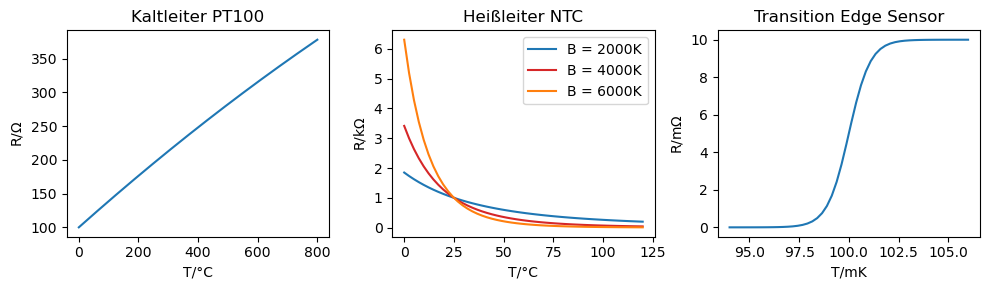

In [1]:
#Benötigte Libraries:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

# MatplotLib Settings:
plt.style.use('default') # Matplotlib Style wählen
#plt.xkcd()
plt.rcParams['font.size'] = 10; # Schriftgröße

#--------- Kaltleiter PT100 -------------
T_PT = np.linspace(0, 800, num=800)
def R_PT(T_PT):
    R_0 = 100 # in Ohm
    A = 3.93e-3 # in 1/°C
    B = -5.7e-7 # in 1/^C^2
    return R_0 * (1 + A*T_PT + B * T_PT**2)

#--------- Heißleiter NTC -------------
T_NTC = np.linspace(0+273.15, 120+273.15, num=50)
def R_NTC(T_NTC, B):
    R_25 = 1000 # in Ohm
    T_25 = 25.0 + 273.15 # in Kelvin
    return R_25 * np.exp(B * (1/(T_NTC) - 1/T_25))

#--------- Transition Edge Sensor -------------
T = np.linspace(94, 106, num=50)
def R(T):
    k = 1.86 # in 1/mK
    a = 0.01 # in Ohm
    Tk = 100 # in mK
    return a / (1+ np.exp(-k * (T-Tk)))


#--------- Diagramme -------------
f, axs = plt.subplots(1,3,figsize=(10,3))

axs[0].plot(T_PT,R_PT(T_PT), color = 'tab:blue')
axs[0].set_xlabel('T/°C')
axs[0].set_ylabel(r'R/$\Omega$')
axs[0].set_title('Kaltleiter PT100')

axs[1].plot(T_NTC-273.15,R_NTC(T_NTC, 2000)/1000, label = "B = 2000K", color = 'tab:blue')
axs[1].plot(T_NTC-273.15,R_NTC(T_NTC, 4000)/1000, label = "B = 4000K", color = 'tab:red')
axs[1].plot(T_NTC-273.15,R_NTC(T_NTC, 6000)/1000, label = "B = 6000K", color = 'tab:orange')
axs[1].set_xlabel('T/°C')
axs[1].set_ylabel(r'R/k$\Omega$')
axs[1].set_title('Heißleiter NTC')
axs[1].legend()

axs[2].plot(T,R(T)*1000, color = 'tab:blue')
axs[2].set_xlabel('T/mK')
axs[2].set_ylabel(r'R/m$\Omega$')
axs[2].set_title('Transition Edge Sensor')

plt.tight_layout()
plt.show()

### Laserinterferometer

::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
How does LIGO work?? Working Principles of LIGO l LIGO technology l LIGO in science (englisch, TIP Knowledge)

<iframe width="200" height="113" src="https://www.youtube.com/embed/trQNpZHL8KM?si=G0PqgFzXdbCuLMxR" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::


Laserinterferometer sind extrem empfindliche Messinstrumente und in modernen Messaufbauten fast immer vorhanden, wenn Längenänderungen, Geschwindikeiten oder Beschleunigungen gemessen werden soll. 
In einem Interferometer werden Längen durch die Messung von Phasenverschiebungen von zwei interferierenden elektromagnetischen Wellen (Laser) bestimmt. Die Phasenverschiebung ist direkt mit der Weglängendifferenz zwischen den beiden Wellen verbunden. 

:::{figure-md} ifo1
<img src="draw/ifo1.png" alt="ifo1" class="bg-primary mb-1" width="500px" label = ifo1>

Laserinterferometer.
:::

Um eine Längenmessung durchzuführen, benötigen wir die Information über die Wellenlänge des verwendeten Lichts, da die Phasenverschiebung und die Wellenlänge in einer festen Beziehung stehen.
Die allgemeine Beziehung ist:

$$ 2 \cdot \Delta L = \left( \frac{\Delta \phi}{2\pi} \right) \cdot \lambda $$

wo:
- $\Delta L$ ist die Weglängendifferenz,
- $ \Delta \phi$ ist die Phasenverschiebung in Radiant,
- $ \lambda $ ist die Wellenlänge des Lichts.

Der Faktor 2 resultiert daraus, dass in Interferometern der Laserstrahl reflektiert wird und somit die Weglängendifferenz 2x durchläuft. Dies erhöht die Empfindlichkeit noch einmal um den Faktor 2. 

Wenn wir die Phasenverschiebung und die Wellenlänge kennen, können wir die Weglängendifferenz berechnen, die einer Längenänderung entspricht. Im Kontext eines Interferometers wird diese Längenänderung durch die Bewegung eines Spiegels oder eines anderen Objekts erzeugt, das den optischen Pfad des Lichts beeinflusst. Durch die Messung der Phasenverschiebung und die Kenntnis der Wellenlänge können wir daher die Längenänderung präzise bestimmen.

Die Kennlinie eines einfachen Interferometers ist besonders, sie zeigt nämlich eine periodische Funktion: Die Ausgangsintensität variiert sinusförmig mit der Phasenverschiebung. Die *Empfindlichkeit des Interferometers* – also seine Fähigkeit, kleine Änderungen zu detektieren – ist an den Wendepunkten der sinusförmigen Kurve am höchsten (Ableitung maximal). An den Extrempunkten ist die Empfindlichkeit null, da hier kleine Änderungen der Phasenverschiebung keine Änderung im Ausgangssignal bewirken (Ableitung verschwindet).

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


# Initialisierung des Plots und der Achsen
fig, ax = plt.subplots(figsize=(7, 4))
fig.subplots_adjust(left=0.25, bottom=0.25)  # Adjust the spacing

# Berechnung der Intensität in Abhängigkeit von der Phasenverschiebung
def calculate_interferometer_signal(phase_difference):
    intensity = np.cos(phase_difference / 2.0)**2
    return intensity



# Aktualisierungsfunktion für den Slider
def update(val):
    phase_difference = np.linspace(0, 4 * np.pi, 1000)

    intensity = calculate_interferometer_signal(phase_difference+val)
    
    ax.plot(phase_difference, calculate_interferometer_signal(phase_difference), color='tab:blue', lw=4, alpha=0.5, label='in Ruhe')
    ax.plot(phase_difference, intensity, color='tab:red', label='Bewegung =%5.2f rad =%5.2f $\mu$m (Wellenlänge = 1$\mu$m)'%(val, (val)/(4*np.pi)))
    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Phasenverschiebung (rad)')
    ax.set_ylabel('Intensität')
    ax.set_ylim([0, 1])
    ax.grid(True)
    ax.legend(loc='lower left')



# Funktion zur Aktualisierung der Animation
def animate(val):
    ax.clear()
    update(val)

# Create an animation by varying reflectivity from 0.01 to 0.99 with a step of 0.01
ani = FuncAnimation(fig, animate, frames=np.arange(0.0, 3*np.pi, 0.1), repeat=False)

# Anzeigen der Animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

### Laserinterferometer mit optischen Resonatoren

Die Empfindlichkeit von Interferometern kann durch den Einsatz von *optischen Resonatoren* stark verbessert werden. Wie bereits oben erwähnt erhöht sich die Empfindlichkeit der Längenmessung um den Faktor 2 für einen *einfachen* Reflektions-Aufbau. Mittels zusätzlichen Spiegeln können sogenannte *optische Resonatoren* geschaffen werden, die die Anzahl der Reflektionen für die Längenmessung zusätzlich erhöhen. 
In einem Laserinterferometer mit optischen Resonatoren wird die Messung der Phasenverschiebung und der Längenänderung durch die Resonanzeigenschaften der Resonatoren erweitert. Die optischen Resonatoren "speichern" das Licht, indem sie es zwischen zwei Spiegeln hin und her reflektieren, wodurch die effektive Weglänge des Lichts verlängert wird. Dies erhöht die Empfindlichkeit des Interferometers für Längenänderungen.

:::{figure-md} ifo_oR
<img src="draw/ifo_oR.png" alt="ifo_oR" class="bg-primary mb-1" width="500px" label = ifo_oR>

Laserinterferometer mit optischen Resonator.
:::

Die Längenänderung $ \Delta L $ in einem solchen System ist jetzt:

$$ n \cdot \Delta L = \frac{\Delta \phi \cdot \lambda}{2 \pi} $$

wobei:
- $ \Delta L $ ist die Längenänderung,
- $ \lambda $ ist die Wellenlänge des Lichts.
- $n$ ist die Anzahl der Reflektionen

Das Licht wird dadurch in den *Armen* des Interferometers gespeichert und hierei bis zu 100-1000 mal hin und her reflektiert. Effektiv äbdert sich dadurch die Länge des Interferometerarms und die Empfindlichkeit wird erhöht. Eine kleine Bewegung der Spiegel kann nun eine drastische Änderung im Ausgangssignal verursachen, was die Detektion von sehr kleinen Signalen, wie den von Gravitationswellen verursachten, ermöglicht. Im nachfolgenden Diagramm ist dargestellt, wie sich die Kennlinie in der Anwesenheit von *optischen Resonatoren* in einem Interferometer ändert. Durch das Einstellen der Spiegelreflektivität $R$ wird die Empfindlichkeit eines optischen Resonators eingestellt, diesen Parameter nennt man auch die *Finesse*:

$$\mathcal F =  \frac{\pi \cdot R}{1-R}$$

Dadurch wird die Kennlinie steiler und die Empfindlichkeit steigt stark an! 

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 13; # Schriftgröße


# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(7, 4))


# Funktion zur Berechnung der Intensität in Abhängigkeit von der Phasenverschiebung
def calculate_intensity(reflectivity, phase_difference):
    finesse = np.pi * reflectivity / (1 - reflectivity)
    intensity = 1 / (1 + finesse * np.sin(phase_difference / 2.0)**2)
    return intensity

# Funktion zum Aktualisieren der Grafik
def update(reflectivity):
    x = np.linspace(0, 6 * np.pi, 1000)  # Phasenverschiebung von 0 bis 6*pi
    phase_difference = x
    intensity = calculate_intensity(reflectivity, phase_difference)
    
    ax.plot(phase_difference, calculate_intensity(0.9, phase_difference), color='tab:blue', lw=4, alpha=0.5, label='Resonator Reflektivität: R = 0.9')
    ax.plot(phase_difference, intensity, color='tab:red', label='Resonator Reflektivität: R =%5.2f'%(reflectivity))
    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Phasenverschiebung (rad)')
    ax.set_ylabel('Intensität')
    ax.set_ylim([0, 1])
    ax.grid(True)
    ax.legend(loc='upper right')


# Funktion zur Aktualisierung der Animation
def animate(reflectivity):
    ax.clear()
    update(reflectivity)

# Create an animation by varying reflectivity from 0.01 to 0.99 with a step of 0.01
ani = FuncAnimation(fig, animate, frames=np.arange(0.01, 0.999, 0.01), repeat=False)

# Anzeigen der Animation
plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Man erkennt allerdings auch den Nachteil von sehr hohen Empfindlichkeiten: Der Messbereich wird sehr klein. Sollte sich die Länge nun sehr sehr viel ändern, so kann dies von diesem Messinstrument nicht mehr aufgelöst werden. Anders ausgedrückt: Das Laserinterferometer an sich muss extrem ruhig sein und kein Spiegel darf sich bewegen. Deswegen werden in Gravitationswellendetektoren, die auf diesem Messprinzip beruhen, alle Spiegel mit Kontrollschleifen an ihrem optimalen Arbeitspunkt gehalten. 

Gravitationswellen sind besonders faszinierend, da wir durch ihre Detektion kosmolgische Objekte aufspüren können, die wir mit anderen Teleskopen nicht wahrnehmen können, da sie kein Licht aussenden. Hauptmotivation ist hierbei die Detektion von Schwarzen Löchern, die sich umeinander rum bewegen. Aufgrund ihrer gegenseitigen Gravitationskraft vollziehen sie diesen Tanz und verändern dabei die Raumzeit. Um euch ein Bild davon zu machen: Die stärkste bisher gemessene Gravitationswelle hat die 4 km langen Arme von LIGO um nur etwa $\Delta L = 10^{-19}\,\mathrm m$ verändert. Daraus können wir direkt auf die *Stärke* dieses astronomischen Ereignisses schließen. Die Gravitationswelle hat die uns umgebende Raumzeit um

$$h = \frac{dL}{L} \approx 5\cdot 10^{-22}$$

verändert.
Nimmt man den Abstand von Erde und Sonne (150 000 000 km), würde sich dieser beim Einfall einer Gravitationswellen um weniger als einen Atomdurchmesser ändern:

In [3]:
h = 1e-22
d_Erde_Sonne = 150e9 # Abstand Erde Sonne in m
dL_Erde_Sonne = d_Erde_Sonne * h
print('Abstandsänderung Erde-Sonne verursacht durch Gravitationswelle: ')
print(dL_Erde_Sonne, ' = ',dL_Erde_Sonne*1e12, 'pm')

Abstandsänderung Erde-Sonne verursacht durch Gravitationswelle: 
3.75e-12  =  3.75 pm


Die Größe eines Atoms beträgt um die 100 pm = 1 A (Angstrom = 10 $^{-10}$). 

Die Technologie hinter LIGO und anderen Gravitationswellendetektoren wie VIRGO und KAGRA ist ein faszinierendes Beispiel dafür, wie fortschrittliche Messtechnik und hohe Präzision es uns ermöglichen, die fundamentalen Aspekte unseres Universums zu erforschen und besser zu verstehen.